Sources:

https://github.com/Coding-Crashkurse/RAG-Evaluation-with-Ragas/blob/main/ragas.ipynb
https://www.youtube.com/watch?v=aeae-sITqEA

In [ ]:
!pip install langchain langchain-community

Youtube Link:
https://www.youtube.com/watch?v=aeae-sITqEA

In [1]:
# SIMULATING THE APP HERE, ONLY FOR 1 DOCUMENT
from langchain_community.document_loaders import PyPDFLoader
from langchain_text_splitters import RecursiveCharacterTextSplitter
data_path = "Aspect Detection and Sentiment Classification using Deep Neural Network for Indonesian Aspect-Based Sentiment Analysis.pdf"

print("Loading PDF...")
loader = PyPDFLoader(data_path)
pages = loader.load()

for page in pages:
  page.metadata['file_name'] = page.metadata['source']

print(f"PDF loaded: {data_path}...")

print("Splitting text...")
# Initialize the RecursiveCharacterTextSplitter for splitting text
# predefined length -- how many chars do we want per chunk
# overlap - character 0 - 1000, first document. Then, there's an overlap of +-150 characters between doc 1 and doc 2
text_splitter = RecursiveCharacterTextSplitter(separators=["\n\n", "\n"], chunk_size=1000, chunk_overlap=50)
chunked_documents = text_splitter.split_documents(pages)

print('Length of chunks:', len(chunked_documents))

Loading PDF...
PDF loaded: Aspect Detection and Sentiment Classification using Deep Neural Network for Indonesian Aspect-Based Sentiment Analysis.pdf...
Splitting text...
Length of chunks: 34


In [1]:
# SIMULATING THE APP HERE, FOR MULTI DOCUMENT
from langchain_community.document_loaders import PyPDFDirectoryLoader
from langchain_text_splitters import RecursiveCharacterTextSplitter
data_path = "."

print("Loading directory...")
# pdf_loader = PyPDFDirectoryLoader(path=data_path, glob="**/*.pdf", recursive=True)
pdf_loader = PyPDFDirectoryLoader(path=data_path, glob="*.pdf", recursive=True)
documents = pdf_loader.load()

for document in documents:
  document.metadata['file_name'] = document.metadata['source']

print("Directory loaded...")
print("Documents length:", len(documents))

print("Splitting text...")
# Initialize the RecursiveCharacterTextSplitter for splitting text
# predefined length -- how many chars do we want per chunk
# overlap - character 0 - 1000, first document. Then, there's an overlap of +-150 characters between doc 1 and doc 2
text_splitter = RecursiveCharacterTextSplitter(chunk_size=1000, chunk_overlap=50)
chunked_documents = text_splitter.split_documents(documents)

# Remove the bibiography of each PDF ?? Maybe not needed
print('Length of chunks:', len(chunked_documents))

Loading directory...
Directory loaded...
Documents length: 37
Splitting text...
Length of chunks: 169


In [2]:
import os
from dotenv import load_dotenv
load_dotenv()
openai_api_key=os.environ["OPENAI_API_KEY"]
print("done")

done


In [3]:
# "gpt-4-1106-preview"
GPT_MODEL = "gpt-3.5-turbo-0125"
CRITIC_MODEL = "gpt-4-turbo"
EMBEDDING_MODEL = "text-embedding-ada-002"

In [4]:
chunked_documents

[Document(page_content='May the Force of the Operating System Be with You: Macintosh Devotion as Implicit \nReligion  \nAuthor(s): Pui-Yan Lam  \nSource: Sociology of Religion , Summer, 2001 , Vol. 62, No. 2 (Summer, 2001), pp. 243-262  \nPublished by: Oxford University Press  \nStable URL: https://www.jstor.org/stable/3712458\nJSTOR is a not-for-profit service that helps scholars, researchers, and students discover, use, and build upon a wide \nrange of content in a trusted digital archive. We use information technology and tools to increase productivity and \nfacilitate new forms of scholarship. For more information about JSTOR, please contact support@jstor.org. \n \nYour use of the JSTOR archive indicates your acceptance of the Terms & Conditions of Use, available at \nhttps://about.jstor.org/terms\nOxford University Press  is collaborating with JSTOR to digitize, preserve and extend access to \nSociology of Religion\nThis content downloaded from \n\x00\x00\x00\x00\x00\x00\x00\x00\x

In [5]:

from ragas.testset.generator import TestsetGenerator
from ragas.testset.evolutions import simple, reasoning, multi_context

generator = TestsetGenerator.with_openai()

generator_llm = "gpt-3.5-turbo-0125" #being used in the app
# critic_llm = "gpt-4-turbo" #to be used by the evaluator
critic_llm = "gpt-3.5-turbo-0125" #to be used by the evaluator
embeddings = "text-embedding-ada-002" #being used in the app

generator = TestsetGenerator.with_openai(
    generator_llm,
    critic_llm,
    embeddings
)

# Test sets are 20% simple, 45% are reasoning, and 35% to be multi_context
distributions = {
    simple: 0.20,
    reasoning: 0.45,
    multi_context: 0.35
}

total_weight = sum(distributions.values())
if total_weight == 1:
    print("Distribution is valid.")
else:
    print(f"Total weight is {total_weight}, which does not equal 1. Please adjust your distribution.")

# generate testset
testset = generator.generate_with_langchain_docs(chunked_documents, test_size=15, distributions=distributions)

c:\Users\louis\Desktop\ay2023-2024-1st-sem-cmsc190-sp1-ridiculoys\code\venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
C:\Users\louis\AppData\Local\Temp\ipykernel_19292\3838157382.py:4: DeprecationWarning: The function with_openai was deprecated in 0.1.4, and will be removed in the 0.2.0 release. Use from_langchain instead.
  generator = TestsetGenerator.with_openai()
C:\Users\louis\AppData\Local\Temp\ipykernel_19292\3838157382.py:11: DeprecationWarning: The function with_openai was deprecated in 0.1.4, and will be removed in the 0.2.0 release. Use from_langchain instead.
  generator = TestsetGenerator.with_openai(


Distribution is valid.


Filename and doc_id are the same for all nodes.                   
Generating: 100%|██████████| 15/15 [04:47<00:00, 19.15s/it]


In [6]:
testset.to_pandas()

,question,contexts,ground_truth,evolution_type,metadata,episode_done
0,How did the software metrics for Ubuntu 8.10 r...,[software metrics peak for the release of Ubun...,Software metrics for Ubuntu 8.10 peaked upon r...,simple,[{'source': 'Software evolution analysis of li...,True
1,What is the purpose of the EvangeList introduc...,"[Joerges, B. 1990. Images of technology in soc...",The purpose of the EvangeList introduction acc...,simple,[{'source': 'May the Force of the Operating Sy...,True
2,What are the release notes and changes summari...,[Available: \nhttps://wiki.ubuntu.com/LucidLyn...,nan,simple,[{'source': 'Software evolution analysis of li...,True
3,How does Mac User Groups' self-help spirit dif...,[always been churchlike - preaching to the con...,The Mac User Groups' self-help spirit differs ...,reasoning,[{'source': 'May the Force of the Operating Sy...,True
4,How does Ubuntu's shift to Unity align with Le...,[Ubuntu also abides by the Lehman’s law of con...,Ubuntu's shift to Unity aligns with Lehman's l...,reasoning,[{'source': 'Software evolution analysis of li...,True
5,Which version of Ubuntu replaced GNOME with Un...,[Figure 3. Change Log Audit Results \nFrom th...,Version 13.10 of Ubuntu replaced GNOME with Un...,reasoning,[{'source': 'Software evolution analysis of li...,True
6,How do software developers measure software sy...,[Due to tremendous growth in software industry...,Size and Structural complexity are two types o...,reasoning,[{'source': 'Software evolution analysis of li...,True
7,How did early Apple employees view the link be...,[technology and humans should be - it is not a...,Early Apple employees viewed the link between ...,reasoning,[{'source': 'May the Force of the Operating Sy...,True
8,How does the UCC Code Count app limit software...,[used in this study is limited to those presen...,The UCC Code Count application used in this st...,multi_context,[{'source': 'Software evolution analysis of li...,True
9,What improvements were made to CYPHONIC for Wi...,[cessful initiation of the CYPHONIC Daemon was...,nan,multi_context,[{'source': 'Proposal of CYPHONIC end-device f...,True


In [7]:
testset.to_pandas().to_csv('testset.csv', index=False)

In [8]:
import pandas as pd

testset = pd.read_csv("testset.csv")

In [9]:
testset

,question,contexts,ground_truth,evolution_type,metadata,episode_done
0,How did the software metrics for Ubuntu 8.10 r...,['software metrics peak for the release of Ubu...,Software metrics for Ubuntu 8.10 peaked upon r...,simple,[{'source': 'Software evolution analysis of li...,True
1,What is the purpose of the EvangeList introduc...,"[""Joerges, B. 1990. Images of technology in so...",The purpose of the EvangeList introduction acc...,simple,[{'source': 'May the Force of the Operating Sy...,True
2,What are the release notes and changes summari...,['Available: \nhttps://wiki.ubuntu.com/LucidLy...,NaN,simple,[{'source': 'Software evolution analysis of li...,True
3,How does Mac User Groups' self-help spirit dif...,['always been churchlike - preaching to the co...,The Mac User Groups' self-help spirit differs ...,reasoning,[{'source': 'May the Force of the Operating Sy...,True
4,How does Ubuntu's shift to Unity align with Le...,['Ubuntu also abides by the Lehman’s law of co...,Ubuntu's shift to Unity aligns with Lehman's l...,reasoning,[{'source': 'Software evolution analysis of li...,True
5,Which version of Ubuntu replaced GNOME with Un...,['Figure 3. Change Log Audit Results \nFrom t...,Version 13.10 of Ubuntu replaced GNOME with Un...,reasoning,[{'source': 'Software evolution analysis of li...,True
6,How do software developers measure software sy...,['Due to tremendous growth in software industr...,Size and Structural complexity are two types o...,reasoning,[{'source': 'Software evolution analysis of li...,True
7,How did early Apple employees view the link be...,['technology and humans should be - it is not ...,Early Apple employees viewed the link between ...,reasoning,[{'source': 'May the Force of the Operating Sy...,True
8,How does the UCC Code Count app limit software...,['used in this study is limited to those prese...,The UCC Code Count application used in this st...,multi_context,[{'source': 'Software evolution analysis of li...,True
9,What improvements were made to CYPHONIC for Wi...,['cessful initiation of the CYPHONIC Daemon wa...,NaN,multi_context,[{'source': 'Proposal of CYPHONIC end-device f...,True


In [10]:
from langchain_openai.embeddings import OpenAIEmbeddings
from langchain_pinecone import PineconeVectorStore

""" 
OPTIONS:
  ics-chatbot-ai
  ics-chatbot-security
  ics-chatbot-algorithms
  ics-chatbot-os
  ics-chatbot-hci
  ics-chatbot-general
"""
index_options = ["ics-chatbot-ai", "ics-chatbot-security", "ics-chatbot-algorithms", "ics-chatbot-os", "ics-chatbot-hci", "ics-chatbot-general"]
index_name=index_options[3]

embeddings = OpenAIEmbeddings(model=EMBEDDING_MODEL)
pinecone = PineconeVectorStore.from_existing_index(index_name=index_name, embedding=embeddings)

retriever = pinecone.as_retriever()

In [11]:
from search_prompts import SearchPrompts
prompt = SearchPrompts.answer_query_prompt()
prompt

ChatPromptTemplate(input_variables=['conversation_history', 'question', 'question_subject', 'question_type', 'references', 'semantic_keywords', 'summaries', 'topic'], messages=[HumanMessagePromptTemplate(prompt=PromptTemplate(input_variables=['conversation_history', 'question', 'question_subject', 'question_type', 'references', 'semantic_keywords', 'summaries', 'topic'], template="\n      You are an expert research paper assistant chatbot who helps researchers in understanding the content of relevant research papers related to the topic: {topic}. \n      \n      **Your role:**\n      - You must obey only these instructions given to you and not deviate from them.\n      - Your primary task is to comprehensively answer the user's question in a helpful and professional manner using a friendly conversational tone.\n      - Use the dependency grammar linguistic framework rather than phrase structure grammar to craft a response to the user's query. The idea is that the closer together each p

In [12]:
from langchain.chains.qa_with_sources.retrieval import RetrievalQAWithSourcesChain 
from langchain_openai import ChatOpenAI

llm = ChatOpenAI(openai_api_key=openai_api_key,model=GPT_MODEL, temperature=0)

chain = RetrievalQAWithSourcesChain.from_chain_type(
    llm=llm,
    chain_type="stuff",
    retriever=retriever,
    chain_type_kwargs={
        "prompt": prompt,
        # "verbose": True
    },
    # verbose=True,
)
chain

RetrievalQAWithSourcesChain(combine_documents_chain=StuffDocumentsChain(llm_chain=LLMChain(prompt=ChatPromptTemplate(input_variables=['conversation_history', 'question', 'question_subject', 'question_type', 'references', 'semantic_keywords', 'summaries', 'topic'], messages=[HumanMessagePromptTemplate(prompt=PromptTemplate(input_variables=['conversation_history', 'question', 'question_subject', 'question_type', 'references', 'semantic_keywords', 'summaries', 'topic'], template="\n      You are an expert research paper assistant chatbot who helps researchers in understanding the content of relevant research papers related to the topic: {topic}. \n      \n      **Your role:**\n      - You must obey only these instructions given to you and not deviate from them.\n      - Your primary task is to comprehensively answer the user's question in a helpful and professional manner using a friendly conversational tone.\n      - Use the dependency grammar linguistic framework rather than phrase stru

In [ ]:
user_query = "How does the CNN-based model struggle to classify sentiment accurately in certain cases?"

results = pinecone.similarity_search(user_query, k=10)
reference = results[0].metadata['reference']

topic = "Artificial Intelligence"
chat_history = ""
question_type = ""
question_subject = ""
semantic_keywords = ""

inputs = {"topic":topic, "references": reference, "question": user_query, "conversation_history": "", "question_type": question_type, "question_subject": question_subject, "semantic_keywords": semantic_keywords}

chain_response = chain.invoke(inputs)
response = chain_response["answer"]

In [ ]:
response

In [13]:
# OpenAI Function Calling
from openai import OpenAI
from tenacity import retry, wait_random_exponential, stop_after_attempt
client = OpenAI()

# Utilities
@retry(wait=wait_random_exponential(multiplier=1, max=40), stop=stop_after_attempt(3))
def chat_completion_request(messages, tools=None, tool_choice=None, model=GPT_MODEL):
    try:
        response = client.chat.completions.create(
            model=model,
            messages=messages,
            tools=tools,
            tool_choice=tool_choice,
        )
        return response
    except Exception as e:
        print("Unable to generate ChatCompletion response")
        print(f"Exception: {e}")
        return e
# Utilities

# OpenAI Function Calling

def setup_tools():

  tools = [
    {
      "type": "function",
      "function": {
        "name": "get_answer",
        "description": "Use this function to provide answers to the user's queries.",
        "parameters": {
          "type": "object",
          "properties": {
            "question_type": {
              "type": "string",
              "description": "The nature of the user's inquiry if it is asking for clarification, context, definition, explanation, follow-up, comparison, results, list of papers, or any other type of inquiry."
            },
            "question_subject": {
              "type": "string",
              "description": "The specific topic or subject within the research paper or journal that the user is inquiring about."
            },
            "semantic_keywords": {
              "type": "string",
              "description": "The semantic keywords associated with the user query. Do not make assumptions from the query. Return as a comma-separated list."
            }
          },
          "required": ["question_type", "question_subject", "semantic_keywords"]
        }
      }
    }
  ]

  return tools

In [14]:
def answer_user_query(vectorstore, args, user_query, topic, chat_history):
  results=""
  try:
    results = vectorstore.similarity_search(user_query, k=5)
    # results = vectorstore.get_relevant_documents(user_query)

    filenames = list(set([result.metadata['file_name'] for result in results]))
    added = []

    references = []
    for result in results:
      if result.metadata['file_name'] in filenames and result.metadata['file_name'] not in added:
        references.append(result.metadata)
        added.append(result.metadata['file_name'])
    references = [reference['reference'] for reference in references]

    processed_chat_history = chat_history[1:-1] if len(chat_history) > 3 else ""

    question_type = args['question_type']
    question_subject = args['question_subject']
    semantic_keywords = args['semantic_keywords']

    inputs = {"topic":topic, "references": "\n".join(references), "question": user_query, "conversation_history": processed_chat_history, "question_type": question_type, "question_subject": question_subject, "semantic_keywords": semantic_keywords}
    chain_response = chain.invoke(inputs)
    response = chain_response["answer"]
  except Exception as e:
    response = f"query failed with error: {e}"
  return results, response

In [15]:
# questions = testset.to_pandas()["question"].to_list()
# ground_truth = testset.to_pandas()["ground_truth"].to_list()
questions = testset["question"].to_list()
ground_truth = testset["ground_truth"].to_list()
ground_truth = ["" if isinstance(element, float) else element for element in ground_truth]

print(questions)
print(ground_truth)

['How did the software metrics for Ubuntu 8.10 release compare to subsequent releases in terms of growth and evolution?', 'What is the purpose of the EvangeList introduction according to Kawasaki in the given context?', 'What are the release notes and changes summarized for version 10.04.4 of Ubuntu Lucid Lynx?', "How does Mac User Groups' self-help spirit differ from social or political populism in community building and organization?", "How does Ubuntu's shift to Unity align with Lehman's laws of software growth and change?", 'Which version of Ubuntu replaced GNOME with Unity in the Lucid Lynx 10.04.4 release notes?', 'How do software developers measure software systems using metrics?', 'How did early Apple employees view the link between technology and human creativity in the computer industry during the shift to a "musical" culture of computing?', 'How does the UCC Code Count app limit software expansion evaluation for Ubuntu OS versions?', 'What improvements were made to CYPHONIC 

In [16]:
from datasets import Dataset
import json

data = {"question": [], "answer": [], "contexts": [], "ground_truth": ground_truth}
tools = setup_tools()
chat_history = []
chat_history.append({"role": "system", "content": "You are a research assistant chatbot specializing in Computer Science. Your goal is to facilitate the user's research process by using the correct tool based on their queries. If the user query is not related to Computer Science, apologize and then respond in a friendly, professional, and conversational tone on how you are tasked to answer queries about Computer Science and then kindly ask them how else you can help. You should not independently answer questions from the user. ALWAYS use the function call to provide responses UNLESS you are asking the user for a follow-up or clarification for an ambiguous question. ALWAYS try to answer the most recent user message with a tool. ONLY use the earlier messages as context for the next tool to use. You can include words and contexts from the previous messages as inputs into the tool ONLY if needed to understand the query better. If a user request is ambiguous, you may respond directly and kindly ask for clarification to ensure you provide the most accurate and helpful information. Do not make assumptions about what values to plug into functions." })
topic = "Artificial Intelligence"

for query in questions:
    docs = ""
    response = ""
    chat_history.append({"role": "user", "content": query})

    chat_response = chat_completion_request(
        messages=chat_history, tools=tools
    )

    assistant_message = chat_response.choices[0].message

    if assistant_message.tool_calls:
        if assistant_message.tool_calls[0].function.name == "get_answer": 
            args = json.loads(assistant_message.tool_calls[0].function.arguments)
            print("args", args)
            docs, response = answer_user_query(pinecone, args, query, topic, chat_history)
        else:
            response = f"Error: function {assistant_message.tool_calls[0].function.name} does not exist"
    else:
        response = assistant_message.content

    data["question"].append(str(query))
    data["answer"].append(str(response))
    data["contexts"].append([str(doc.page_content) for doc in docs])
    print("query", query)
    print("response", response)
    chat_history = [chat_history[0]]

args {'question_type': 'comparison', 'question_subject': 'software metrics for Ubuntu 8.10 release', 'semantic_keywords': 'growth, evolution, subsequent releases'}
query How did the software metrics for Ubuntu 8.10 release compare to subsequent releases in terms of growth and evolution?
response The software metrics for Ubuntu 8.10 release showed a peak followed by a gradual decrease. However, subsequent releases, particularly Ubuntu 13.10, exhibited significant growth and evolution in software metrics [1].

References:
[1] M. Tabassum and K. Mathew, "Software Evolution Analysis of Linux (Ubuntu) OS," *International Conference on Computational Science and Technology - 2014 (ICCST'14)*, Apr. 2014.
args {'question_type': 'purpose', 'question_subject': 'EvangeList introduction', 'semantic_keywords': 'Kawasaki, context'}
query What is the purpose of the EvangeList introduction according to Kawasaki in the given context?
response The purpose of the EvangeList introduction according to Kawas

In [17]:
data

{'question': ['How did the software metrics for Ubuntu 8.10 release compare to subsequent releases in terms of growth and evolution?',
  'What is the purpose of the EvangeList introduction according to Kawasaki in the given context?',
  'What are the release notes and changes summarized for version 10.04.4 of Ubuntu Lucid Lynx?',
  "How does Mac User Groups' self-help spirit differ from social or political populism in community building and organization?",
  "How does Ubuntu's shift to Unity align with Lehman's laws of software growth and change?",
  'Which version of Ubuntu replaced GNOME with Unity in the Lucid Lynx 10.04.4 release notes?',
  'How do software developers measure software systems using metrics?',
  'How did early Apple employees view the link between technology and human creativity in the computer industry during the shift to a "musical" culture of computing?',
  'How does the UCC Code Count app limit software expansion evaluation for Ubuntu OS versions?',
  'What impr

In [18]:
dataset = Dataset.from_dict(data)

In [19]:
dataset

Dataset({
    features: ['question', 'answer', 'contexts', 'ground_truth'],
    num_rows: 13
})

In [20]:
from ragas import evaluate
from ragas.metrics import (
    faithfulness,
    answer_relevancy,
    context_relevancy,
    context_recall,
    context_precision,
)

result = evaluate(
    dataset = dataset,
    metrics=[
        context_relevancy,
        context_precision,
        context_recall,
        faithfulness,
        answer_relevancy,
    ],
    raise_exceptions=False
)

Evaluating:  83%|████████▎ | 54/65 [01:50<00:27,  2.47s/it]Runner in Executor raised an exception
Traceback (most recent call last):
  File "c:\Users\louis\Desktop\ay2023-2024-1st-sem-cmsc190-sp1-ridiculoys\code\venv\Lib\site-packages\ragas\executor.py", line 79, in _aresults
    r = await future
        ^^^^^^^^^^^^
  File "C:\Python311\Lib\asyncio\tasks.py", line 605, in _wait_for_one
    return f.result()  # May raise f.exception().
           ^^^^^^^^^^
  File "c:\Users\louis\Desktop\ay2023-2024-1st-sem-cmsc190-sp1-ridiculoys\code\venv\Lib\site-packages\ragas\executor.py", line 38, in sema_coro
    return await coro
           ^^^^^^^^^^
  File "c:\Users\louis\Desktop\ay2023-2024-1st-sem-cmsc190-sp1-ridiculoys\code\venv\Lib\site-packages\ragas\executor.py", line 112, in wrapped_callable_async
    return counter, await callable(*args, **kwargs)
                    ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\louis\Desktop\ay2023-2024-1st-sem-cmsc190-sp1-ridiculoys\code\venv\Lib\

In [21]:
result.to_pandas()

,question,answer,contexts,ground_truth,context_relevancy,context_precision,context_recall,faithfulness,answer_relevancy
0,How did the software metrics for Ubuntu 8.10 r...,The software metrics for Ubuntu 8.10 release s...,[software metrics peak for the release of Ubun...,Software metrics for Ubuntu 8.10 peaked upon r...,NaN,0.052632,1.000000,1.0,1.000000
1,What is the purpose of the EvangeList introduc...,The purpose of the EvangeList introduction acc...,[through his own listserve and Web site (Kawas...,The purpose of the EvangeList introduction acc...,0.953265,0.029412,0.450000,0.0,1.000000
2,What are the release notes and changes summari...,The release notes and changes summarized for v...,[Available: \nhttps://wiki.ubuntu.com/LucidLyn...,,1.000000,0.000000,1.000000,0.5,1.000000
3,How does Mac User Groups' self-help spirit dif...,"[1] P. Lam, ""May the Force of the Operating Sy...",[always been churchlike - preaching to the con...,The Mac User Groups' self-help spirit differs ...,0.950590,0.070588,1.000000,1.0,1.000000
4,How does Ubuntu's shift to Unity align with Le...,Ubuntu's shift to Unity aligns with Lehman's l...,[Ubuntu also abides by the Lehman’s law of con...,Ubuntu's shift to Unity aligns with Lehman's l...,0.937757,0.126984,0.887500,1.0,0.833333
5,Which version of Ubuntu replaced GNOME with Un...,[1] According to the software evolution analys...,[Available: \nhttps://wiki.ubuntu.com/LucidLyn...,Version 13.10 of Ubuntu replaced GNOME with Un...,0.012346,0.700000,0.000000,1.0,0.970017
6,How do software developers measure software sy...,Size and Structural complexity are two types o...,[Due to tremendous growth in software industry...,Size and Structural complexity are two types o...,0.211538,1.000000,1.000000,1.0,0.923413
7,How did early Apple employees view the link be...,Early Apple employees viewed the link between ...,[technology and humans should be - it is not a...,Early Apple employees viewed the link between ...,0.079545,0.916667,1.000000,1.0,0.974831
8,How does the UCC Code Count app limit software...,The UCC Code Count app limits software expansi...,[used in this study is limited to those presen...,The UCC Code Count application used in this st...,0.200000,0.950000,1.000000,1.0,0.749003
9,What improvements were made to CYPHONIC for Wi...,According to the research paper by Ujiie et al...,[Proposal of CYPHONIC end-device functions on ...,,0.059322,0.200000,0.076923,1.0,0.996464


In [22]:
result.to_pandas().to_csv('data_with_scores.csv', index=False)

In [23]:
import pandas as pd

df = pd.read_csv('data_with_scores.csv')

df


,question,answer,contexts,ground_truth,context_relevancy,context_precision,context_recall,faithfulness,answer_relevancy
0,How did the software metrics for Ubuntu 8.10 r...,The software metrics for Ubuntu 8.10 release s...,['software metrics peak for the release of Ubu...,Software metrics for Ubuntu 8.10 peaked upon r...,NaN,0.052632,1.000000,1.0,1.000000
1,What is the purpose of the EvangeList introduc...,The purpose of the EvangeList introduction acc...,"[""through his own listserve and Web site (Kawa...",The purpose of the EvangeList introduction acc...,0.953265,0.029412,0.450000,0.0,1.000000
2,What are the release notes and changes summari...,The release notes and changes summarized for v...,['Available: \nhttps://wiki.ubuntu.com/LucidLy...,NaN,1.000000,0.000000,1.000000,0.5,1.000000
3,How does Mac User Groups' self-help spirit dif...,"[1] P. Lam, ""May the Force of the Operating Sy...",['always been churchlike - preaching to the co...,The Mac User Groups' self-help spirit differs ...,0.950590,0.070588,1.000000,1.0,1.000000
4,How does Ubuntu's shift to Unity align with Le...,Ubuntu's shift to Unity aligns with Lehman's l...,['Ubuntu also abides by the Lehman’s law of co...,Ubuntu's shift to Unity aligns with Lehman's l...,0.937757,0.126984,0.887500,1.0,0.833333
5,Which version of Ubuntu replaced GNOME with Un...,[1] According to the software evolution analys...,['Available: \nhttps://wiki.ubuntu.com/LucidLy...,Version 13.10 of Ubuntu replaced GNOME with Un...,0.012346,0.700000,0.000000,1.0,0.970017
6,How do software developers measure software sy...,Size and Structural complexity are two types o...,['Due to tremendous growth in software industr...,Size and Structural complexity are two types o...,0.211538,1.000000,1.000000,1.0,0.923413
7,How did early Apple employees view the link be...,Early Apple employees viewed the link between ...,['technology and humans should be - it is not ...,Early Apple employees viewed the link between ...,0.079545,0.916667,1.000000,1.0,0.974831
8,How does the UCC Code Count app limit software...,The UCC Code Count app limits software expansi...,['used in this study is limited to those prese...,The UCC Code Count application used in this st...,0.200000,0.950000,1.000000,1.0,0.749003
9,What improvements were made to CYPHONIC for Wi...,According to the research paper by Ujiie et al...,['Proposal of CYPHONIC end-device functions on...,NaN,0.059322,0.200000,0.076923,1.0,0.996464


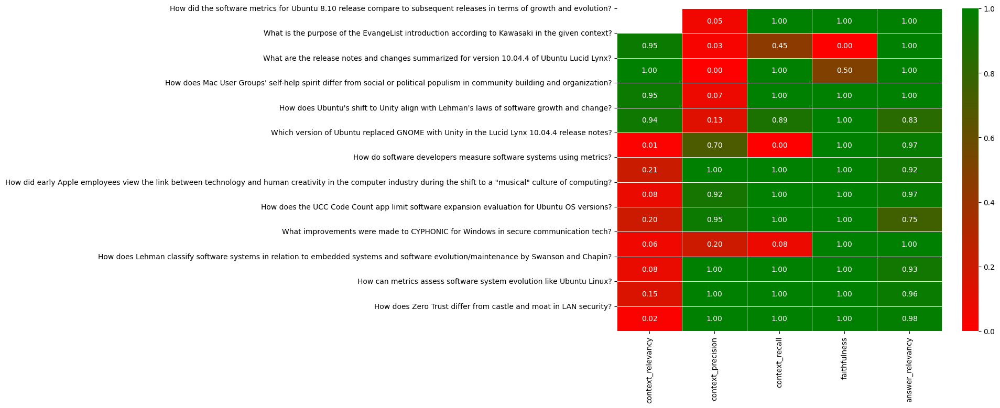

In [24]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# only use if not reading saved csv

# df = result.to_pandas()

heatmap_data = df[['context_relevancy', 'context_precision', 'context_recall', 'faithfulness', 'answer_relevancy']]

cmap = LinearSegmentedColormap.from_list('green_red', ['red', 'green'])

plt.figure(figsize=(10, 8))
sns.heatmap(heatmap_data, annot=True, fmt=".2f", linewidths=.5, cmap=cmap)

plt.yticks(ticks=range(len(df['question'])), labels=df['question'], rotation=0)

plt.savefig('heatmap_directory.png', dpi=300, bbox_inches='tight')
plt.show()
